## Algoritmo 1  
## Catalina Alvarez Latorre - 202220307

## 1. Preparacion del notebook 

In [28]:
!pip install ydata-profiling
!pip install wordcloud

## 2. Importaciones y carga de datos 

In [44]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.cluster import DBSCAN
from sklearn.preprocessing import StandardScaler
from sklearn.impute import SimpleImputer
from sklearn.decomposition import PCA
from sklearn.metrics import silhouette_score


# Configurar estilo de gráficos

In [30]:
sns.set(style="whitegrid", palette="muted", color_codes=True)
plt.rcParams["figure.figsize"] = (8, 6)

# Se cargan los datos

In [31]:

df_original = pd.read_csv(r'C:\Users\Catalina\OneDrive\Documents\UNIANDES\6SEMESTRE\BI\Lab2-agrupacion-G33-\Lab2-agrupacion-G33-\Datos\Agrupacion_Customer_Data.csv', sep=';', encoding='latin1', index_col=0)
df_original.head()

,SALDO,F_SALDO,COMPRAS,COMPRAS_PUNTUALES,COMPRAS_PLAZOS,AVANCE_EFECTIVO,F_COMPRAS,F_COMPRAS_PUNTUALES,F_COMPRAS_PLAZOS,F_AVANCE_EFECTIVO,P_AVANCE_EFECTIVO,P_COMPRAS,LÍMITE_CREDITO,PAGOS,PAGOS_MINIMOS,F_PAGOS_COMPLETOS,MESES_CLIENTE
ID,,,,,,,,,,,,,,,,,
C10001,5323.148883,0.250693,26344.07220,38237.442520,3727.113162,15708.239680,0.496536,0.464442,0.821611,0.194502,100,77,16819.48004,21337.027460,39452.95812,0.817907,7
C10002,12726.638120,0.791307,37958.51902,5690.742440,18733.810960,38284.354430,0.699457,0.250327,0.654863,1.083902,78,156,15617.57058,8000.183624,63013.74848,0.343119,9
C10003,4305.572068,0.176531,28392.95334,36009.470090,2873.383232,14294.185030,0.419764,0.523662,0.899912,0.207049,72,81,15515.58621,27111.360490,NaN,0.829074,6
C10004,4740.988511,0.178076,27399.00384,38246.863490,3402.853375,6936.812518,0.439666,0.606597,0.783129,0.228299,78,83,12926.58797,23919.113400,38444.21998,0.883984,7
C10005,13820.920640,0.826914,42214.02163,7341.007821,19273.070990,40091.347850,0.821412,0.283579,0.501361,1.106350,88,182,14404.70507,6994.688474,62041.61734,0.383186,10


In [32]:
df_clean = df_original.copy()

# Se espera que el dataset tenga 18 columnas con la siguiente estructura:

In [35]:


# Si el DataFrame tiene 17 columnas, probablemente el "ID" se usó como índice.
if df_clean.shape[1] == 17:
    df_clean = df_clean.reset_index()  # Convierte el índice en una columna

# Verificar el número de columnas después de resetear el índice
print("Número de columnas luego de reset_index:", df_clean.shape[1])

# Definir los nuevos nombres de columnas (18 columnas)
new_column_names = [
    "id",
    "saldo",
    "f_saldo",
    "compras",
    "compras_puntuales",
    "compras_plazos",
    "avance_efectivo",
    "f_compras",
    "f_compras_puntuales",
    "f_compras_plazos",
    "f_avance_efectivo",
    "p_avance_efectivo",
    "p_compras",
    "limite_credito",
    "pagos",
    "pagos_minimos",
    "f_pagos_completos",
    "meses_cliente"
]

# Verificar que el número de columnas coincide con la lista
if df_clean.shape[1] == len(new_column_names):
    df_clean.columns = new_column_names
    print("Nuevos nombres de columnas asignados:")
    print(df_clean.columns.tolist())
else:
    print("Error: Se esperaban", len(new_column_names), "columnas, pero el dataset tiene", df_clean.shape[1])



Número de columnas luego de reset_index: 18
Nuevos nombres de columnas asignados:
['id', 'saldo', 'f_saldo', 'compras', 'compras_puntuales', 'compras_plazos', 'avance_efectivo', 'f_compras', 'f_compras_puntuales', 'f_compras_plazos', 'f_avance_efectivo', 'p_avance_efectivo', 'p_compras', 'limite_credito', 'pagos', 'pagos_minimos', 'f_pagos_completos', 'meses_cliente']


# Matriz de correlación y heatmap para variables numéricas

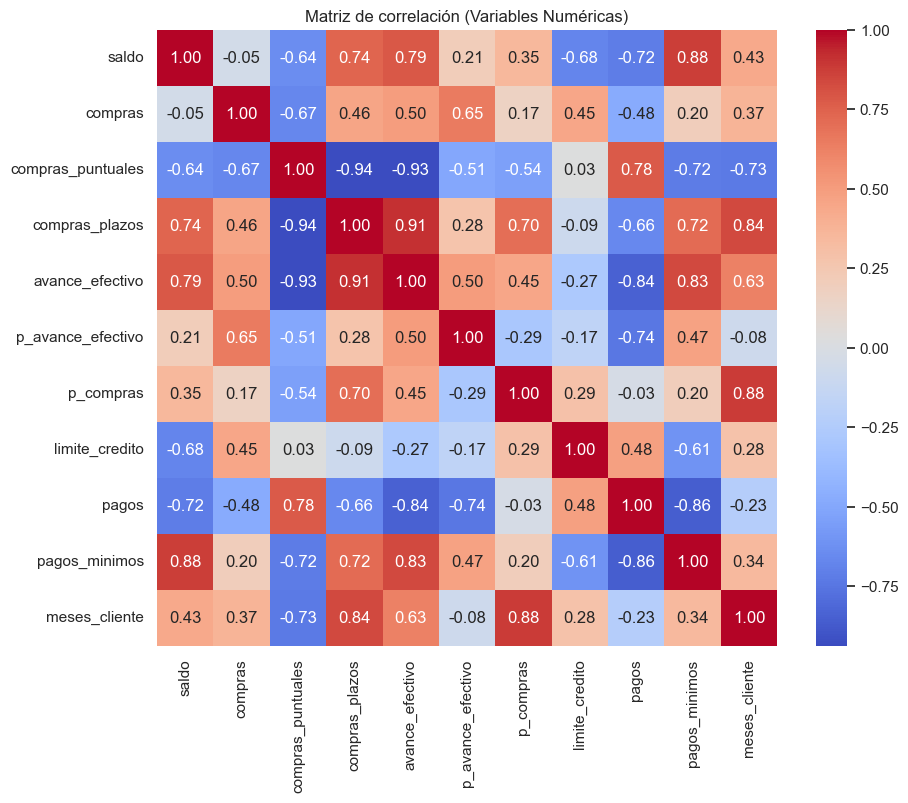

In [36]:
plt.figure(figsize=(10,8))
corr_matrix = df_clean[cols_numericas].corr()
sns.heatmap(corr_matrix, annot=True, fmt=".2f", cmap="coolwarm")
plt.title("Matriz de correlación (Variables Numéricas)")
plt.show()

# Pairplot de las variables numéricas

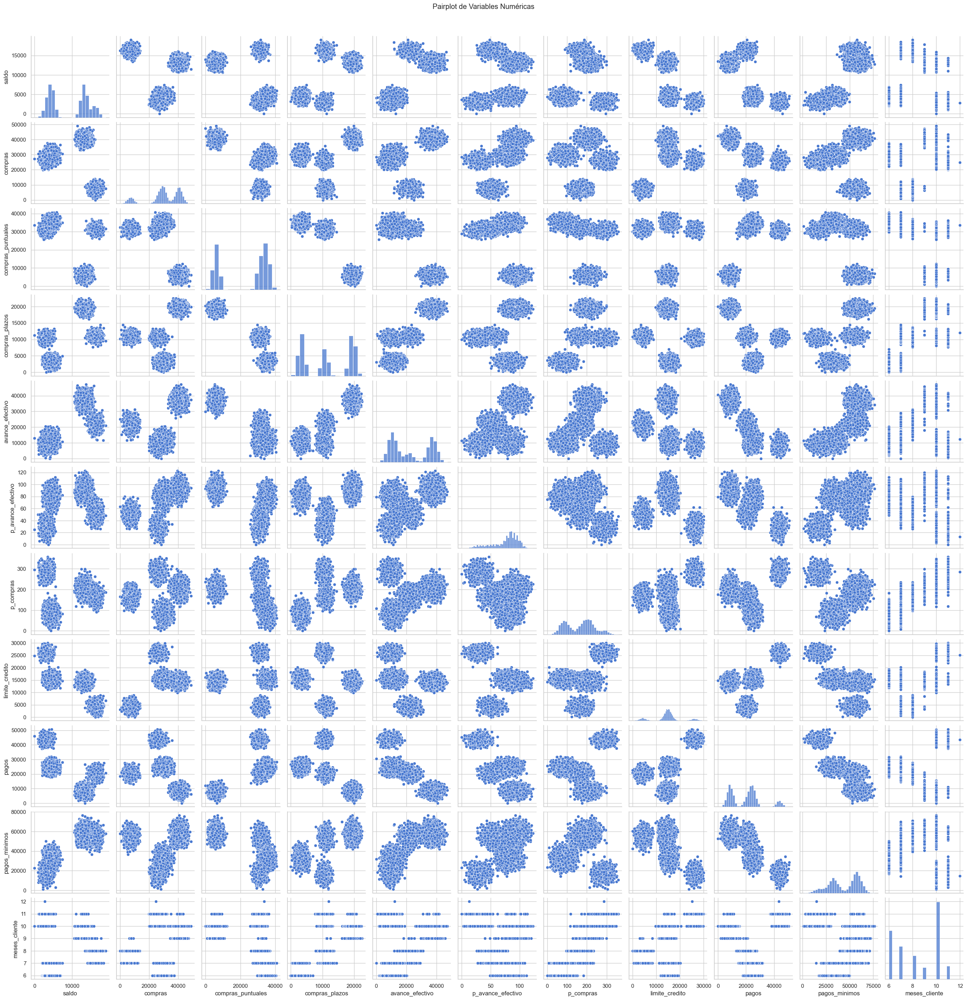

In [37]:
sns.pairplot(df_clean[cols_numericas])
plt.suptitle("Pairplot de Variables Numéricas", y=1.02)
plt.show()

# 4. Preparación de los Datos

In [38]:
data_numeric = df_clean[cols_numericas].copy()

# Manejo de outliers: Utilizando el método IQR y aplicando clipping a cada variable

In [39]:
for col in cols_numericas:
    Q1 = data_numeric[col].quantile(0.25)
    Q3 = data_numeric[col].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    data_numeric[col] = data_numeric[col].clip(lower_bound, upper_bound)
    print(f"{col}: valores limitados a [{lower_bound:.2f}, {upper_bound:.2f}]")

saldo: valores limitados a [-9923.26, 27938.86]
compras: valores limitados a [8028.89, 58902.92]
compras_puntuales: valores limitados a [-34997.49, 76191.16]
compras_plazos: valores limitados a [-19348.82, 42212.63]
avance_efectivo: valores limitados a [-26865.01, 73960.16]
p_avance_efectivo: valores limitados a [24.50, 132.50]
p_compras: valores limitados a [-81.50, 394.50]
limite_credito: valores limitados a [9314.73, 20442.73]
pagos: valores limitados a [-14504.68, 49053.41]
pagos_minimos: valores limitados a [-7711.44, 97044.75]
meses_cliente: valores limitados a [2.50, 14.50]



# Visualización de outliers con boxplots luego del clipping

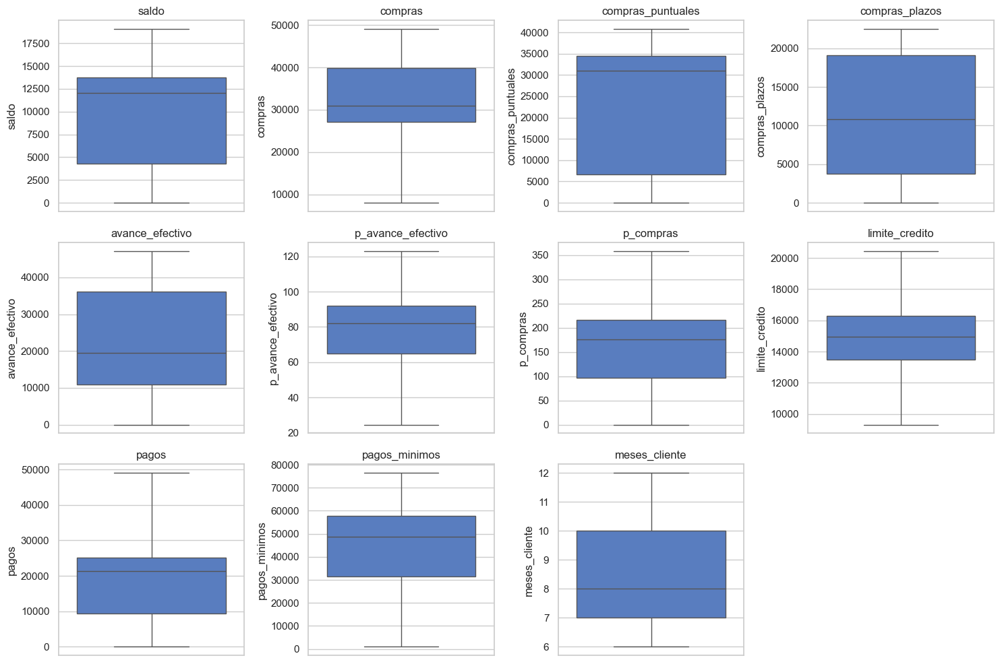

In [40]:
plt.figure(figsize=(15, 10))
for i, col in enumerate(cols_numericas):
    plt.subplot(3, 4, i+1)
    sns.boxplot(y=data_numeric[col])
    plt.title(col)
plt.tight_layout()
plt.show()

# Normalización de los datos

In [45]:


# Imputar los valores faltantes en las variables numéricas usando la mediana
imputer = SimpleImputer(strategy="median")
data_imputed = imputer.fit_transform(data_numeric)

# Normalizar los datos imputados
scaler = StandardScaler()
data_scaled = scaler.fit_transform(data_imputed)

## 5. Creación del Modelo DBSCAN

In [46]:
dbscan = DBSCAN(eps=0.5, min_samples=5)
clusters = dbscan.fit_predict(data_scaled)

df_clean["dbscan_cluster"] = clusters
print("\n=== Conteo de clusters (DBSCAN) ===")
print(df_clean["dbscan_cluster"].value_counts())


=== Conteo de clusters (DBSCAN) ===
dbscan_cluster
 1     2498
-1     1899
 2     1619
 4      969
 6      770
 5      480
 3      303
 7      209
 8      166
 0        6
 10       6
 11       6
 13       5
 9        4
 15       4
 12       3
 14       3
Name: count, dtype: int64


## 6. Evaluación Cuantitativa

In [47]:
mask = clusters != -1
if len(np.unique(clusters[mask])) > 1:
    sil_score = silhouette_score(data_scaled[mask], clusters[mask])
    print("\nCoeficiente de silueta (excluyendo ruido):", sil_score)
else:
    print("\nNo es posible calcular el coeficiente de silueta (no hay suficientes clusters válidos)")



Coeficiente de silueta (excluyendo ruido): 0.03865071964725134


# 7. Evaluación Cualitativa y Visualizaciones Extensas

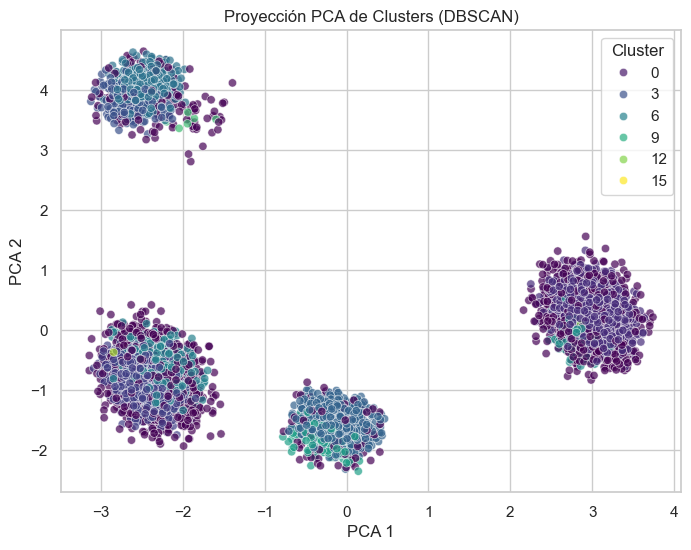

In [48]:
pca = PCA(n_components=2)
data_pca = pca.fit_transform(data_scaled)
df_clean["pca1"] = data_pca[:, 0]
df_clean["pca2"] = data_pca[:, 1]

plt.figure()
sns.scatterplot(x="pca1", y="pca2", hue="dbscan_cluster", data=df_clean, palette="viridis", alpha=0.7)
plt.title("Proyección PCA de Clusters (DBSCAN)")
plt.xlabel("PCA 1")
plt.ylabel("PCA 2")
plt.legend(title="Cluster")
plt.show()

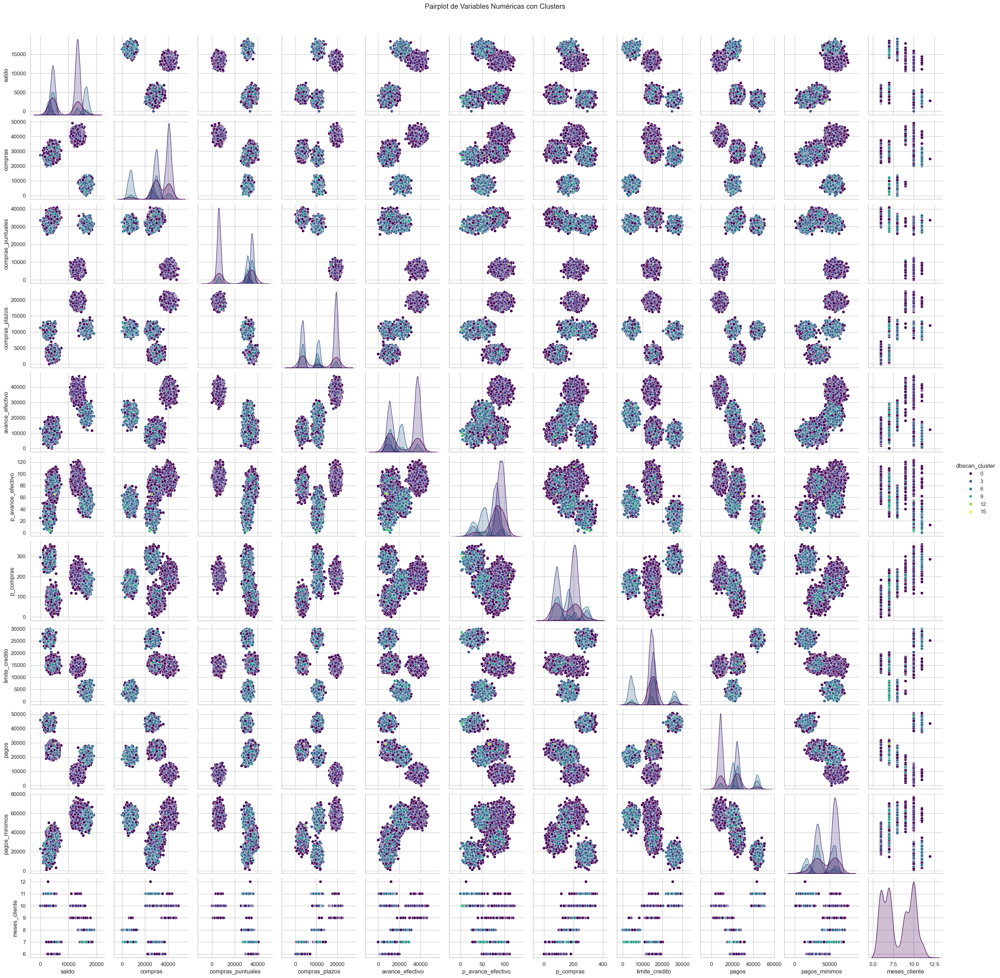

C:\Users\Catalina\AppData\Local\Temp\ipykernel_10908\442151107.py:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x="dbscan_cluster", y=col, data=df_clean, palette="viridis")
C:\Users\Catalina\AppData\Local\Temp\ipykernel_10908\442151107.py:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x="dbscan_cluster", y=col, data=df_clean, palette="viridis")
C:\Users\Catalina\AppData\Local\Temp\ipykernel_10908\442151107.py:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x="dbscan_cluster", y=col, data=df_clean, palette="viridis")
C:\Users\Catalin

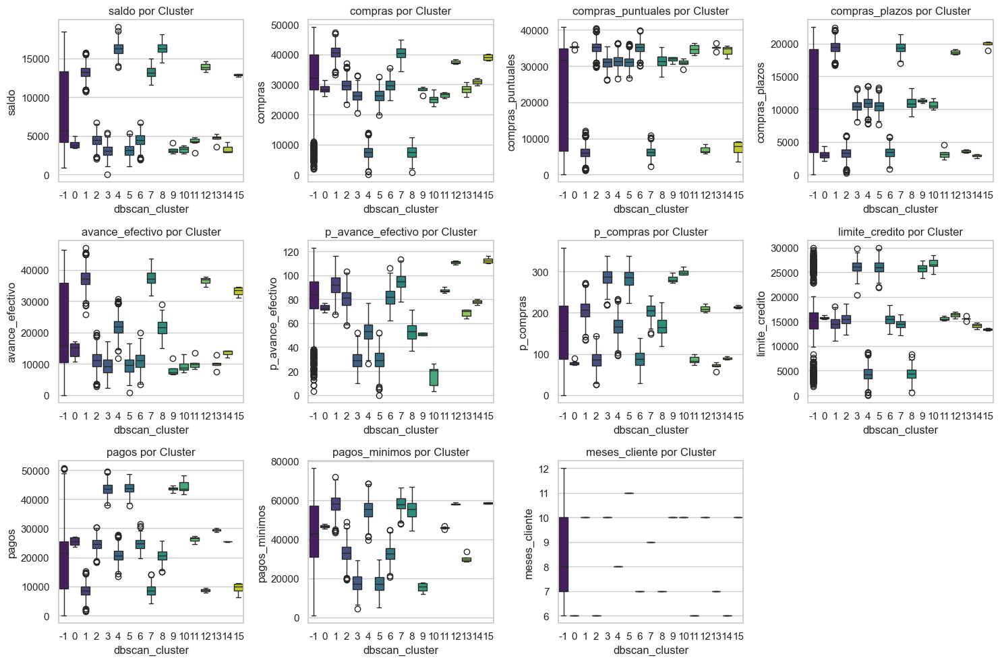

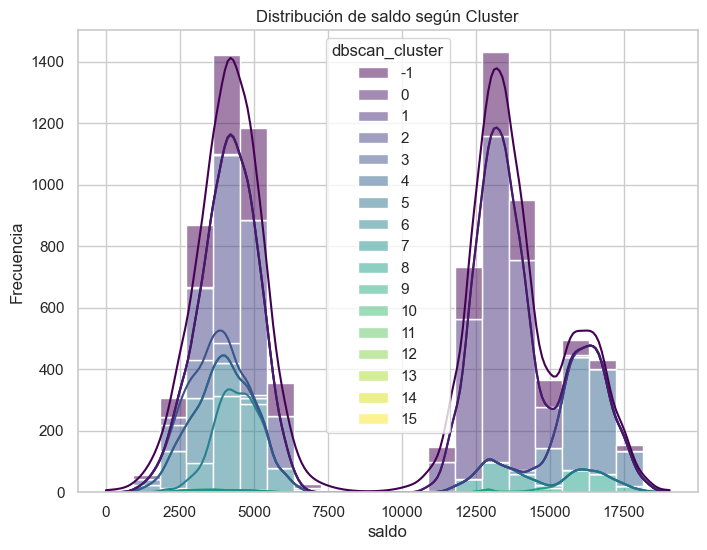

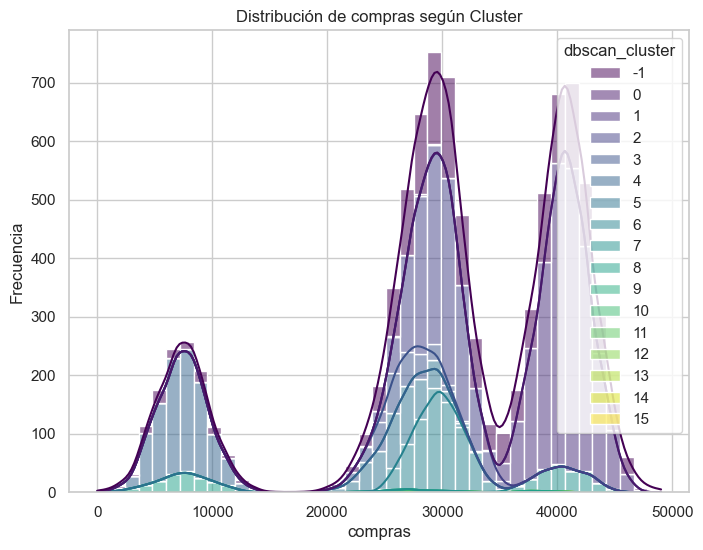

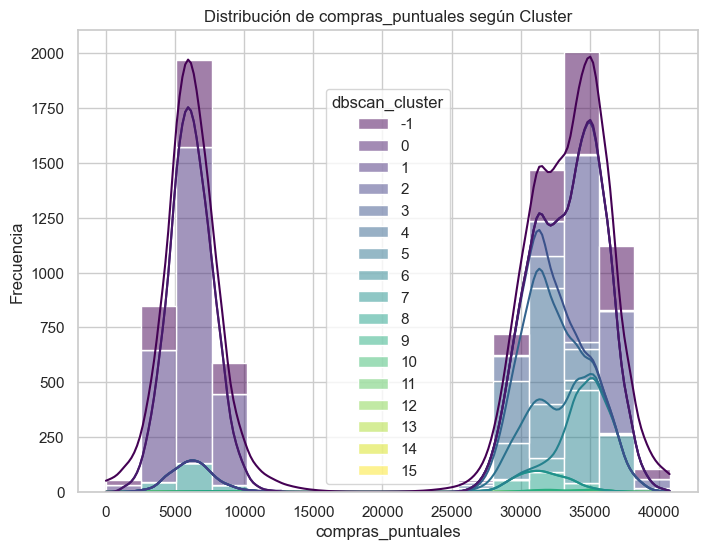

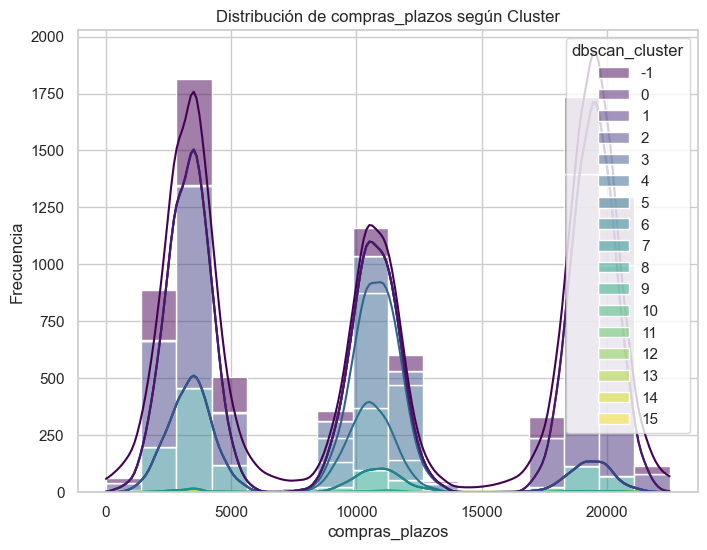

...

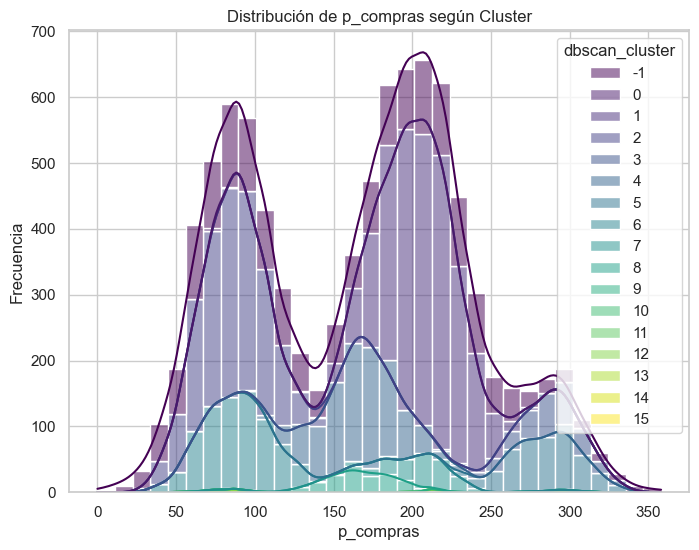

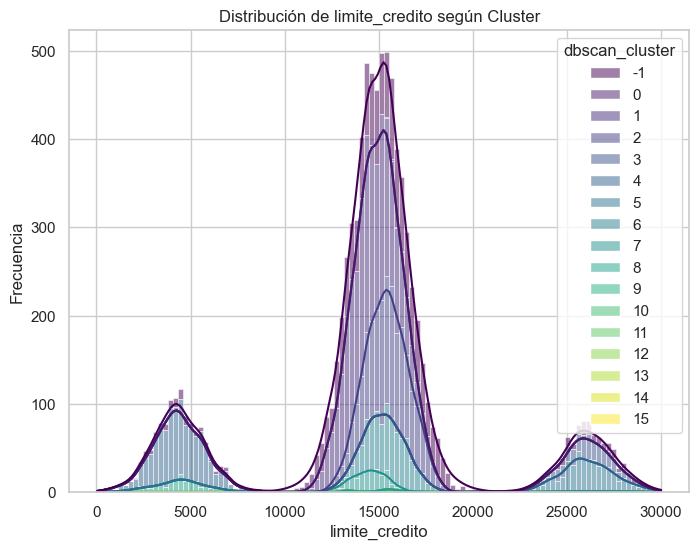

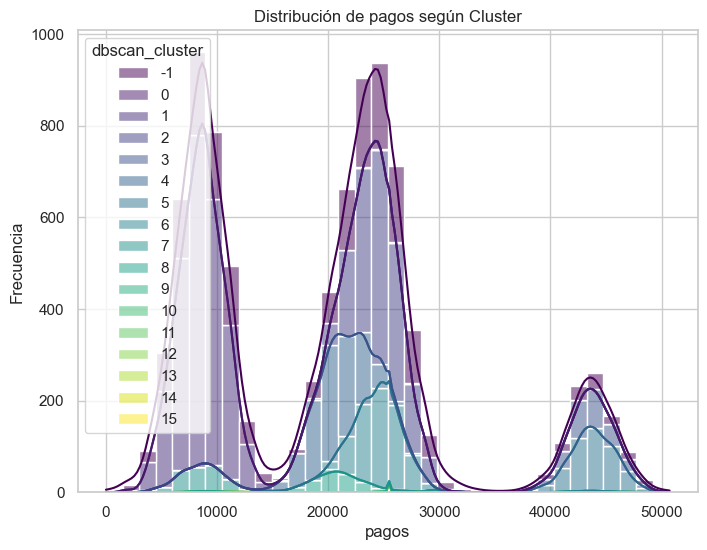

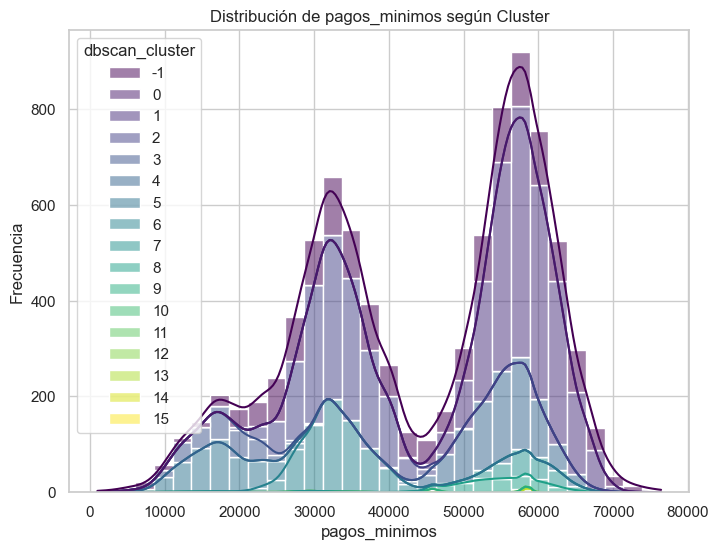

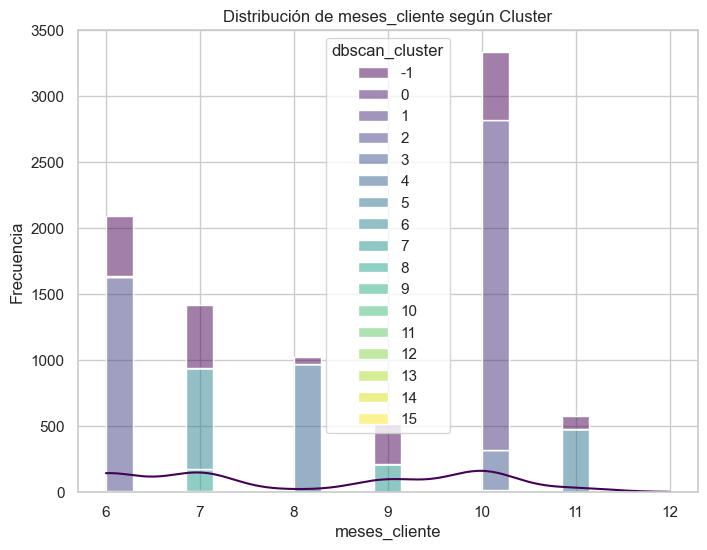


=== Resumen estadístico (medias) por cluster ===
                       saldo       compras  compras_puntuales  compras_plazos  \
dbscan_cluster                                                                  
-1               8601.948837  32671.488411       22887.452484    10854.759965   
 0               3989.375636  28553.233280       35252.086337     3067.781894   
 1              13244.370758  40674.189808        6132.842936    19472.927012   
 2               4444.577712  29724.443939       35142.116085     3269.308731   
 3               3051.129916  26286.911127       31018.584210    10498.029293   
 4              16283.702157   7391.656122       31413.522664    10933.501822   
 5               3152.464439  26278.454916       31063.031924    10472.821427   
 6               4494.889109  29744.929195       35169.546181     3360.283610   
 7              13216.130719  40463.959218        6240.627849    19352.849445   
 8              16321.307846   7448.771525       31358.4345

In [49]:
# Pairplot con cluster
df_result = df_clean[cols_numericas + ["dbscan_cluster"]].copy()
sns.pairplot(df_result, hue="dbscan_cluster", palette="viridis")
plt.suptitle("Pairplot de Variables Numéricas con Clusters", y=1.02)
plt.show()

# Boxplots para cada variable numérica segmentados por cluster
plt.figure(figsize=(15, 10))
for i, col in enumerate(cols_numericas):
    plt.subplot(3, 4, i+1)
    sns.boxplot(x="dbscan_cluster", y=col, data=df_clean, palette="viridis")
    plt.title(f"{col} por Cluster")
plt.tight_layout()
plt.show()

# Histogramas y densidad por cluster para cada variable numérica
for col in cols_numericas:
    plt.figure()
    sns.histplot(data=df_clean, x=col, hue="dbscan_cluster", multiple="stack", kde=True, palette="viridis")
    plt.title(f"Distribución de {col} según Cluster")
    plt.xlabel(col)
    plt.ylabel("Frecuencia")
    plt.show()

# Resumen estadístico (medias) por cluster
cluster_summary = df_clean.groupby("dbscan_cluster")[cols_numericas].mean()
print("\n=== Resumen estadístico (medias) por cluster ===")
print(cluster_summary)

# 8. Estrategias Sugeridas y Conclusiones

 Conclusiones y Estrategias
1. Se realizó un exhaustivo perfilamiento del dataset, evaluando la consistencia, unicidad y validez mediante el análisis de nulos, duplicados y estadísticas descriptivas."
2. La preparación de los datos incluyó la selección de variables numéricas, el manejo de outliers (método IQR y clipping) y la normalización, lo que favorece una correcta aplicación de DBSCAN."
3. El modelo DBSCAN, ajustado inicialmente con eps=0.5 y min_samples=5, permite identificar clusters y detectar puntos atípicos (ruido)."
4. La evaluación cuantitativa (coeficiente de silueta) y las múltiples visualizaciones (PCA, pairplot, boxplots, histogramas y heatmap) facilitan la interpretación de los clusters obtenidos."
5. Se recomienda experimentar con distintos valores de los hiperparámetros y, de ser pertinente, considerar la inclusión de variables categóricas (tras codificación) para enriquecer el análisis."
6. Los hallazgos son útiles para comprender el comportamiento financiero de los clientes y apoyar en la toma de decisiones de negocio."
